---

In [1]:

# purpose
#   - the huge dataset also comes with a few metadata like csv files for support/understandability
#   - read in the csvs that have the metadata about the sensors and locations etc 
#   - post into sep csv for python scripts external 
#   - visualize pretty lat/lon locations

# worth mentioning that 'additional examination will be made later towards capstone or whatever'

# dataset master source:
#  http://www.mcs.anl.gov/research/projects/waggle/downloads/datasets/AoT_Chicago.complete.latest.tar


---

In [2]:
# loading libraries
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import os
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option("display.max_colwidth", None)
import folium
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:

# don't need this form, moved file
# my_file_1 = r'D:\CRITICAL - MAIN DATAFILE - MILESTONE II\AoT_Chicago.complete.2021-09-12\nodes.csv'

my_nodes_file = r'data\nodes.csv'  # main nodes.csv file that comes with huge dataset 

nodes_df = pd.read_csv(my_nodes_file)
    

---

### A) Analyzing the nodes.csv file (metadata): 

In [4]:

# list out all of the unique sensor nodes names (node ids)

# for unique_node in nodes_df.node_id: print(" - ", unique_node)
nodes_df.node_id


0      001e0610ba46
1      001e0610ba3b
2      001e0610f02f
3      001e0610ba8f
4      001e0610ba16
5      001e06107e5d
6      001e0610ba8b
7      001e0610ba13
8      001e0610ba18
9      001e0610bc10
10     001e0610bbf9
11     001e0610bbff
12     001e0610b9e7
13     001e0610ba15
14     001e0610bbe5
15     001e0610ee33
16     001e0610b9e5
17     001e0610f8f4
18     001e0610ee41
19     001e0610eef4
20     001e0610ef29
21     001e0610f668
22     001e0610f730
23     001e0610bc07
24     001e0610ef26
25     001e0610ea5a
26     001e0610ee61
27     001e0610ba81
28     001e0610ba57
29     001e0610ee82
30     001e0610ef27
31     001e0610fb4c
32     001e0610ee6f
33     001e0610ef68
34     001e0610e809
35     001e0610ee36
36     001e061135cb
37     001e0610e532
38     001e0610e8cb
39     001e0610ee5d
40     001e0610ef73
41     001e0610e540
42     001e0610f6dd
43     001e06113ad8
44     001e0611441e
45     001e06113d83
46     001e06112e77
47     001e0610f6db
48     001e06115365
49     001e06113cff


In [5]:

print('\nThere are this many unique sensor nodes: ', len(nodes_df.node_id), "\n")
# they have pretty odd looking identifiers, all starting with 001e06 ...



There are this many unique sensor nodes:  126 



---

In [6]:

nodes_df[nodes_df.columns[:8]].style.hide_index()

# showing all of the rows and columns...
#
# i believe four of the nodes were eventually decommissioned...
# (that is why end_timestamp shows a date when it was killed off)
# we have things like address/lat/long/when it was 'born' (start_timestamp)
# also, project_id is always AoT_Chicago, later they had sensors in new cities... 

# a couple of the nodes have been decommissioned...

# as we will see, under the description, you will find that it contains a S or C or T, 
# from this explanation:

##############################################################################
###  Additional details about a node are contained in the description field. 
###  The letters inside the brackets [ ] indicate:
###     C - Node is equipped with chemical sensors.
###     A - Node is equipped with Alphasense OPN-N2 air quality sensor.
###     P - Node is equipped with Plantower PMS7003 air quality sensor.
##############################################################################


C:\Users\tbresee\AppData\Roaming\Python\Python38\site-packages\mpl_toolkits\mplot3d\__init__.py:1: MatplotlibDeprecationWarning: 
The deprecated function was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  from .axes3d import Axes3D


node_id,project_id,vsn,address,lat,lon,description,start_timestamp
001e0610ba46,AoT_Chicago,004,State St & Jackson Blvd Chicago IL,41.878377,-87.627678,AoT Chicago (S) [C],2017/10/09 00:00:00
001e0610ba3b,AoT_Chicago,006,18th St & Lake Shore Dr Chicago IL,41.858136,-87.616055,AoT Chicago (S),2017/08/08 00:00:00
001e0610f02f,AoT_Chicago,00A,Lake Shore Drive & Fullerton Ave Chicago IL,41.926261,-87.630758,AoT Chicago (S) [CA],2018/05/07 00:00:00
001e0610ba8f,AoT_Chicago,00D,Cornell & 47th St Chicago IL,41.810342,-87.590228,AoT Chicago (S),2017/08/08 00:00:00
001e0610ba16,AoT_Chicago,010,Homan Ave & Roosevelt Rd Chicago IL,41.866349,-87.710543,AoT Chicago (S) [C],2018/07/18 00:00:00
001e06107e5d,AoT_Chicago,014,State St & Washington St Chicago IL,41.883205,-87.627769,AoT Chicago (T),2016/09/14 00:00:00
001e0610ba8b,AoT_Chicago,018,Stony Island Ave & 63rd St Chicago IL,41.780600,-87.586456,AoT Chicago (S) [C],2018/02/26 00:00:00
001e0610ba13,AoT_Chicago,01C,7801 S Lawndale Ave Chicago IL,41.751238,-87.712990,AoT Chicago (S) [C] {ComEd},2018/01/01 00:00:00
001e0610ba18,AoT_Chicago,01D,Damen Ave & Cermak Chicago IL,41.852179,-87.675825,AoT Chicago (S),2017/12/15 00:00:00
001e0610bc10,AoT_Chicago,01F,State St & 87th Chicago IL,41.736314,-87.624179,AoT Chicago (S) [C],2018/02/22 00:00:00


---

### B) Examining other metadata files that come with dataset:

In [7]:
# they also provided a file called 'README', that helps to explain about all the sensors
# this file is written in markdown, so you can just create a new jupyter notebook cell that
# is of type 'markdown', not 'cell', and paste it in for clarity ...

In [8]:
# pasting in README.md below...

In [9]:
# note:  this should be included in the final report for clarity and understanding of what
#        all this data is broken out from... very good to explain to the reader what
#        is origin of everything... maybe put this into a readme.md in github for reader... 

<br>


## --- Project Digest (README) ----

The files in the main data download directory contain sensor data **and** the associated meta-data that
will enable parsing the sensor values.


## Overview

This sensor data digest contains the following files:

* `data.csv.gz` - Sensor data ordered by ascending timestamp.  < - - - 
* `nodes.csv` - Nodes metadata.
* `sensors.csv` - Sensor metadata.
* `provenance.csv` - Provenance metadata.

These files will be described in-depth in the following sections.


### Sensor Data

The sensor data file is an aggregate of all published data from the project's
nodes. By published, they mean:

* Data was read from a whitelisted node belonging to the project.
* Data was read during that node's commissioning period.


The `data.csv.gz` file is a compressed CSV with the following, but not limited to, columns:

* `timestamp` - UTC timestamp of when the measurement was done.
* `node_id` - ID of node which did the measurement.
* `subsystem` - Subsystem of node containing sensor.
* `sensor` - Sensor that was measured.
* `parameter` - Sensor parameter that was measured.
* `value_raw` - Raw measurement value from sensor.
* `value_hrf` - Converted, "human readable" value from sensor.

These fields will always be provided as a header, for example:
```
timestamp,node_id,subsystem,sensor,parameter,value_raw,value_hrf
2017/09/09 22:12:44,001e0610ba8f,lightsense,hih4030,humidity,NA,32.18
2017/09/09 22:12:44,001e0610ba8f,lightsense,hih4030,temperature,NA,48.55
2017/09/09 22:12:44,001e0610ba8f,lightsense,ml8511,intensity,9643,NA
2017/09/09 22:12:44,001e0610ba8f,lightsense,tmp421,temperature,NA,43.81
2017/09/09 22:12:44,001e0610ba8f,metsense,hih4030,humidity,450,NA
2017/09/09 22:12:44,001e0610ba8f,metsense,htu21d,humidity,NA,41.15
2017/09/09 22:12:44,001e0610ba8f,metsense,htu21d,temperature,NA,24.1
2017/09/09 22:12:44,001e0610ba8f,metsense,metsense,id,00001814B7E8,00001814B7E8
2017/09/09 22:12:44,001e0610ba8f,metsense,pr103j2,temperature,839,NA
```

For the purpose of this examinination, we will use as expected the 'value_hrf' human readable data parameter values, as the 'value_raw' is a subset of that...

Sensor data is ordered by ascending timestamp.

Additional information such each node's coordinates or each sensor units can be found
in the metadata. More information about these will be provided in the next two sections.

A sensor values may be marked `NA`, indicating that either the raw or HRF value is
unavailable (at which point that data may be deleted if desired) 


### Node Metadata

The node metadata provides additional information about each of a project's nodes. This
file is a CSV with the following fields:

* `node_id` - ID of node.
* `project_id` - ID of project which manages node.
* `vsn` - Public name for node. The VSN is visible on the physical enclosure.
* `address` - Street address of node installation.
* `lat` - Latitude of node installation.
* `lon` - Longitude of node installation.
* `description` - More detailed description of node's build and configuration.
* `start_timestamp` - Starting timestamp of node installation.
* `end_timestamp` - Ending timestamp of node installation.

These fields will always be provided as a header, for example:
```
node_id,project_id,vsn,address,lat,lon,description,start_timestamp,end_timestamp
001e0610ba46,AoT_Chicago,004,State St & Jackson Blvd Chicago IL,41.878377,-87.627678,AoT Chicago (S) [C],2017/10/09 00:00:00,
001e0610ba3b,AoT_Chicago,006,18th St & Lake Shore Dr Chicago IL,41.858136,-87.616055,AoT Chicago (S),2017/08/08 00:00:00,
001e0610ba8f,AoT_Chicago,00D,Cornell & 47th St Chicago IL,41.810342,-87.590228,AoT Chicago (S),2017/08/08 00:00:00,
001e0610ba16,AoT_Chicago,010,Ohio St & Grand Ave Chicago IL,41.891964,-87.611603,AoT Chicago (S) [C],2017/12/01 00:00:00,2018/06/04 00:00:00
```

Additional details about a node are contained in the description field. The letters
inside the brackets `[ ]` indicate:

* `C` - Node is equipped with chemical sensors.
* `A` - Node is equipped with Alphasense OPN-N2 air quality sensor.
* `P` - Node is equipped with Plantower PMS7003 air quality sensor.


### Sensor Metadata

The sensor metadata provides additional information about each of the sensors published
by the project. This file is a CSV with the following fields:

* `ontology` - Ontology of measurement.
* `subsystem` - Subsystem containing sensor.
* `sensor` - Sensor name.
* `parameter` - Sensor parameter.
* `hrf_unit` - Physical units of HRF value.
* `hrf_minval` - Minimum HRF value according to datasheet. Used as lower bound in range filter.
* `hrf_maxval` - Maximum HRF value according to datasheet. Used as upper bound in range filter.
* `datasheet` - Reference to sensor's datasheet.

These fields will always be provided as a header, for example:
```
ontology,subsystem,sensor,parameter,hrf_unit,hrf_minval,hrf_maxval,datasheet
/sensing/meteorology/pressure,metsense,bmp180,pressure,hPa,300,1100,"https://github.com/waggle-sensor/sensors/blob/master/sensors/airsense/bmp180.pdf"
/sensing/meteorology/temperature,metsense,bmp180,temperature,C,-40,125,"https://github.com/waggle-sensor/sensors/blob/master/sensors/airsense/bmp180.pdf"
/sensing/meteorology/humidity,metsense,hih4030,humidity,RH,0,100,"https://github.com/waggle-sensor/sensors/blob/master/sensors/airsense/htu4030.pdf"
/sensing/meteorology/humidity,metsense,htu21d,humidity,RH,0,100,"https://github.com/waggle-sensor/sensors/blob/master/sensors/airsense/htu21d.pdf"
/sensing/meteorology/temperature,metsense,htu21d,temperature,C,-40,125,"https://github.com/waggle-sensor/sensors/blob/master/sensors/airsense/htu21d.pdf"
```

More in-depth information about each sensor can be found at: https://github.com/waggle-sensor/sensors


### Provenance Metadata

The provenance metadata provides additional information about the origin of this
project digest. This file is a CSV with the following fields:

* `data_format_version` - Data format version.
* `project_id` - Project ID.
* `data_start_date` - Minimum possible publishing UTC timestamp.
* `data_end_date` - Maximum possible publishing UTC timestamp. If no explicit date exists, the creation date is used.
* `creation_date` - UTC timestamp this digest was created.
* `url` - URL where this digest was provided.

These fields will always be provide as a header, for example:
```
data_format_version,project_id,data_start_date,data_end_date,creation_date,url
1,AoT_Chicago.complete,2017/03/31 00:00:00,2018/04/10 15:34:36,2018/04/10 15:34:36,http://www.mcs.anl.gov/research/projects/waggle/downloads/datasets/AoT_Chicago.complete.latest.tar.gz
```


### Useful Links

* Sensors: https://github.com/waggle-sensor/sensors/blob/develop/README.md
* Array of Things: https://arrayofthings.github.io/
* Waggle: http://wa8.gl/




---

---

### C) Analyzing the sensors.csv file (metadata): 

In [10]:

my_sensors_file = r'data\sensors.csv'  

sensors_df = pd.read_csv(my_sensors_file)


In [11]:

sensors_df.sensor


0                   co
1                  h2s
2                  no2
3                   o3
4      oxidizing_gases
5       reducing_gases
6                  so2
7               opc_n2
8               opc_n2
9               opc_n2
10              opc_n2
11             pms7003
12             pms7003
13             pms7003
14             pms7003
15             pms7003
16             pms7003
17             pms7003
18             pms7003
19             pms7003
20             pms7003
21             pms7003
22             pms7003
23             hih4030
24              htu21d
25              bmp180
26              bmp180
27              htu21d
28             pr103j2
29              tmp112
30              tsys01
31          microphone
32          microphone
33          microphone
34          microphone
35          microphone
36          microphone
37          microphone
38          microphone
39          microphone
40          microphone
41          microphone
42            tsl260rd
43       ap

In [12]:

# examining a single sensor

sensors_df.head(1).T


,0
ontology,/sensing/air_quality/gases/co
subsystem,chemsense
sensor,co
parameter,concentration
hrf_unit,ppm
hrf_minval,0.0
hrf_maxval,1000.0
datasheet,https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/co.pdf


In [13]:

# from the github sensor breakout, we see this particular sensor type ('subsystem') below
# (screenshot from https://github.com/waggle-sensor/sensors)
# also, in this case, the sensor is carbon monoxide (co) 
# downloaded co_pdf.pdf into /data folder as well for examinination 


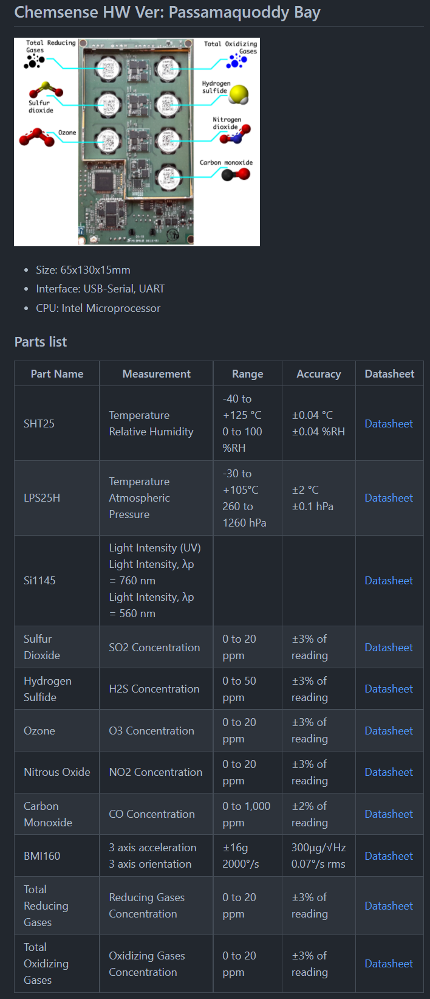


In [14]:

# ignoring the last column which is just a link to the pdf of the spec parameters 
sensors_df[sensors_df.columns[:7]].style.hide_index()


ontology,subsystem,sensor,parameter,hrf_unit,hrf_minval,hrf_maxval
/sensing/air_quality/gases/co,chemsense,co,concentration,ppm,0.000000,1000.000000
/sensing/air_quality/gases/h2s,chemsense,h2s,concentration,ppm,0.000000,50.000000
/sensing/air_quality/gases/no2,chemsense,no2,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/o3,chemsense,o3,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/oxidizing_gases,chemsense,oxidizing_gases,concentration,ppm,0.000000,100.000000
/sensing/air_quality/gases/reducing_gases,chemsense,reducing_gases,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/so2,chemsense,so2,concentration,ppm,0.000000,20.000000
/sensing/air_quality/particulates/particle_count,alphasense,opc_n2,bins,counts,0.000000,nan
/sensing/air_quality/particulates/pm_10,alphasense,opc_n2,pm10,μg/m^3,0.000000,nan
/sensing/air_quality/particulates/pm_2_5,alphasense,opc_n2,pm2_5,μg/m^3,0.000000,nan


In [15]:

# now looking at the spec column
sensors_df[sensors_df.columns[-1:]].style.hide_index()


datasheet
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/co.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/h2s.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/no2.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/o3.pdf
https://github.com/waggle-sensor/sensors/blob/master/sensors/chemsense
https://github.com/waggle-sensor/sensors/blob/master/sensors/chemsense
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/so2.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/opcn2.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/opcn2.pdf
https://github.com/waggle-sensor/sensors/raw/master/sensors/datasheets/opcn2.pdf


In [16]:

# side note, there are a few diff common sensors, another is shown below
# (as you can see, some measure air quality, other light information, others common
#  things like temp/pressure/etc)


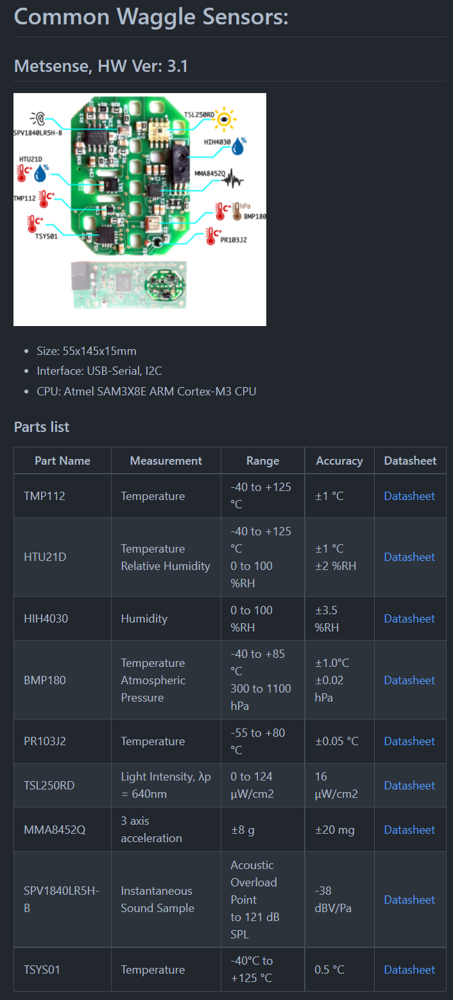

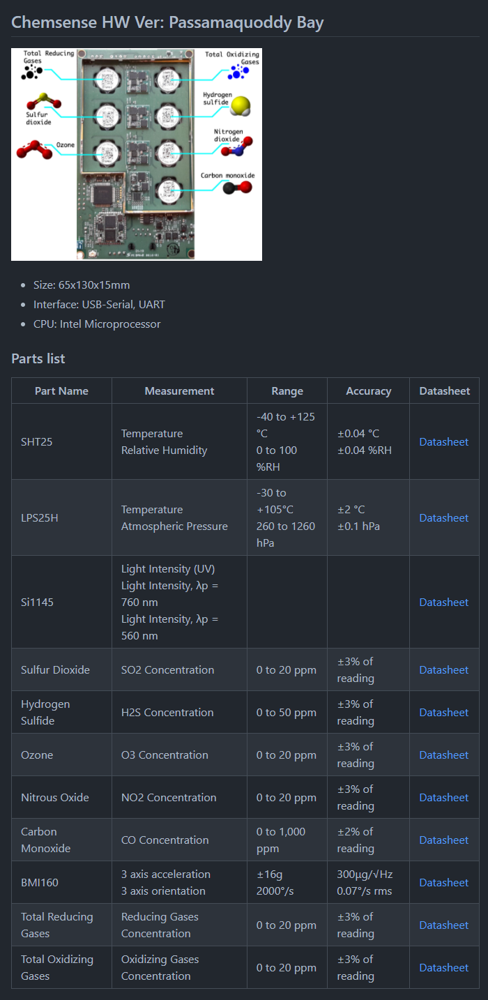

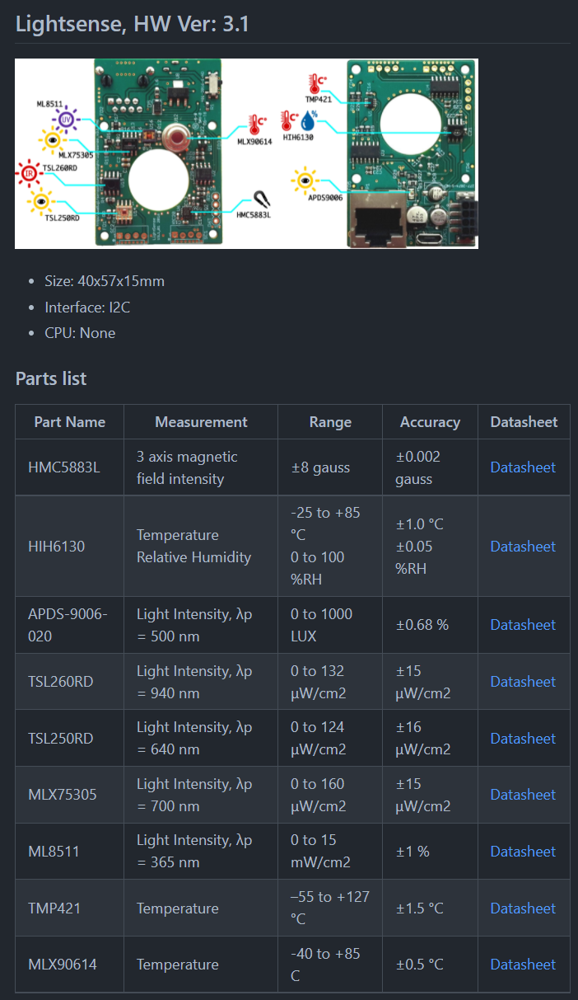

```
NOTE: 

The Waggle Platform is an open source software and hardware platform
for intelligent sensors with advanced edge computing and support for
machine learning.  The Waggle Platform is used by several wireless
sensor projects, including the Array of Things project
(https://arrayofthings.github.io).  For more information on the Waggle
Platform, see:

See http://www.wa8.gl for details.

For details on the open source software license for Waggle components,
please see the file LICENSE.waggle.txt. Some source code files may not
have been originally authored by members of the Waggle team.  In such
cases, a small note describing the modifications for Waggle have been
added to the original copyright and license.
```

---

####  looking at just the particular sensor 'metsense', which we know contains the following 9 subsensors (variables):

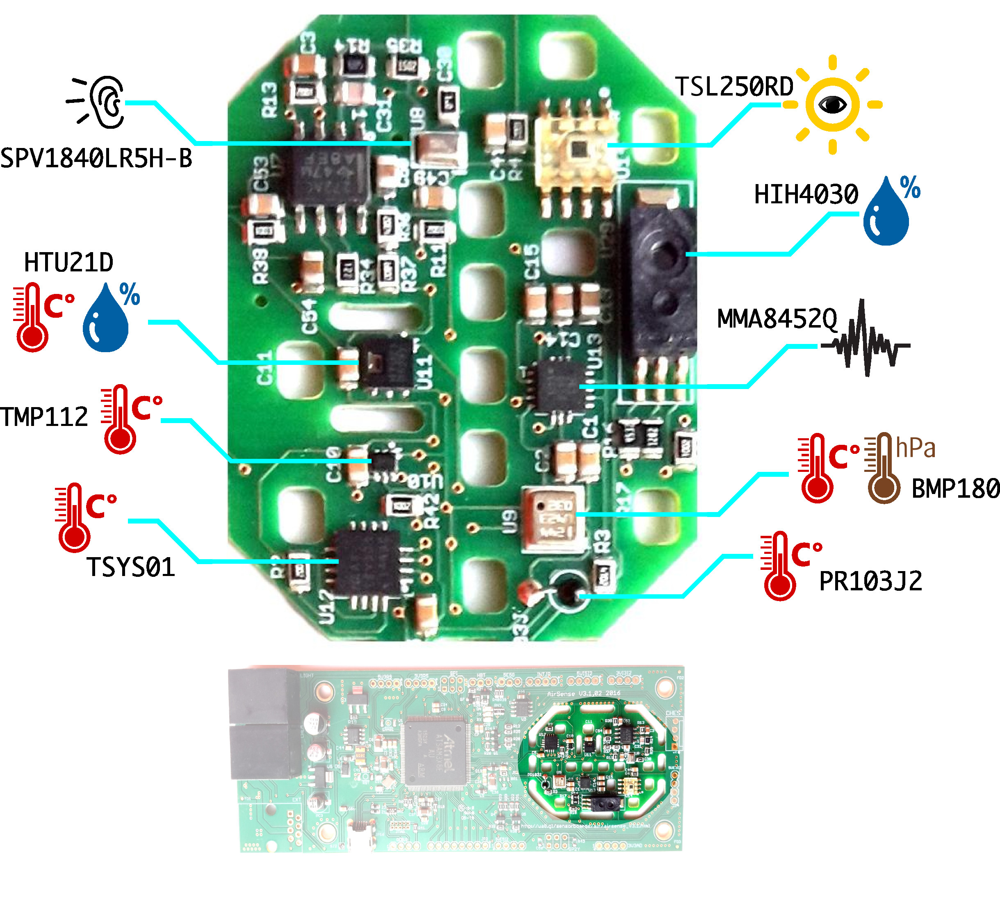

i.e. the 'sensor' column is the 'part name' from the spec sheet, we know that
HIH4030 is a humidity sensor for instance, there should be 9ish main sensors
within that subsystem metsense

In [17]:

sensors_df[sensors_df['subsystem']=='metsense'][sensors_df.columns[:7]].style.hide_index()


ontology,subsystem,sensor,parameter,hrf_unit,hrf_minval,hrf_maxval
/sensing/meteorology/humidity,metsense,hih4030,humidity,RH,0.000000,100.000000
/sensing/meteorology/humidity,metsense,htu21d,humidity,RH,0.000000,100.000000
/sensing/meteorology/pressure,metsense,bmp180,pressure,hPa,300.000000,1100.000000
/sensing/meteorology/temperature,metsense,bmp180,temperature,C,-40.000000,85.000000
/sensing/meteorology/temperature,metsense,htu21d,temperature,C,-40.000000,125.000000
/sensing/meteorology/temperature,metsense,pr103j2,temperature,C,-55.000000,80.000000
/sensing/meteorology/temperature,metsense,tmp112,temperature,C,-40.000000,125.000000
/sensing/meteorology/temperature,metsense,tsys01,temperature,C,-40.000000,125.000000
/sensing/physical/sound_level,metsense,spv1840lr5h_b,intensity,dB,0.000000,121.000000
/sensing/physical/vibration,metsense,mma8452q,acceleration_x,mg,-8000.000000,8000.000000


In [18]:

sensors_df[sensors_df['subsystem']=='chemsense'][sensors_df.columns[:7]].style.hide_index()


ontology,subsystem,sensor,parameter,hrf_unit,hrf_minval,hrf_maxval
/sensing/air_quality/gases/co,chemsense,co,concentration,ppm,0.000000,1000.000000
/sensing/air_quality/gases/h2s,chemsense,h2s,concentration,ppm,0.000000,50.000000
/sensing/air_quality/gases/no2,chemsense,no2,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/o3,chemsense,o3,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/oxidizing_gases,chemsense,oxidizing_gases,concentration,ppm,0.000000,100.000000
/sensing/air_quality/gases/reducing_gases,chemsense,reducing_gases,concentration,ppm,0.000000,20.000000
/sensing/air_quality/gases/so2,chemsense,so2,concentration,ppm,0.000000,20.000000
/system/environment/ir,chemsense,si1145,ir_intensity,uW/cm^2,0.000000,nan
/system/environment/light,chemsense,si1145,visible_light_intensity,uW/cm^2,0.000000,nan
/system/environment/uv,chemsense,si1145,uv_intensity,uW/cm^2,nan,nan


In [19]:

sensors_df[sensors_df['subsystem']=='lightsense'][sensors_df.columns[:7]].style.hide_index()


ontology,subsystem,sensor,parameter,hrf_unit,hrf_minval,hrf_maxval
/sensing/physical/ir,lightsense,tsl260rd,intensity,uW/cm^2,0.000000,132.000000
/sensing/physical/light,lightsense,apds_9006_020,intensity,lux,0.000000,1000.000000
/sensing/physical/light,lightsense,mlx75305,intensity,uW/cm^2,0.000000,160.000000
/sensing/physical/light,lightsense,tsl250rd,intensity,uW/cm^2,0.000000,124.000000
/sensing/physical/magnetic_field,lightsense,hmc5883l,magnetic_field_x,mG,-8000.000000,8000.000000
/sensing/physical/magnetic_field,lightsense,hmc5883l,magnetic_field_y,mG,-8000.000000,8000.000000
/sensing/physical/magnetic_field,lightsense,hmc5883l,magnetic_field_z,mG,-8000.000000,8000.000000
/sensing/physical/uv,lightsense,ml8511,intensity,uW/cm^2,0.000000,15.000000
/system/environment/humidity,lightsense,hih6130,humidity,RH,0.000000,100.000000
/system/environment/temperature,lightsense,hih6130,temperature,C,-25.000000,85.000000


In [20]:

# i have this many unique sensor 'boxes'

sensors_df['subsystem'].unique()



array(['chemsense', 'alphasense', 'plantower', 'metsense', 'audio',
       'lightsense', 'wagman', 'nc', 'ep', 'image'], dtype=object)

In [21]:

len(sensors_df)

# effectively we have about 193 variables involved, which are spread among unique sensors 


193

In [22]:

# side note:  all temps appear to usually be in Celsius (C) and NOT F, probably want to 
#             convert for ease of understanding


<br>

It is worth noting that at a later point, it may be possible to correlate rise in one sensor's values with higher temperatures (that are able to be monitored via other separate sensors).  This would allow the ability to properly normalize the chemical sensor's output

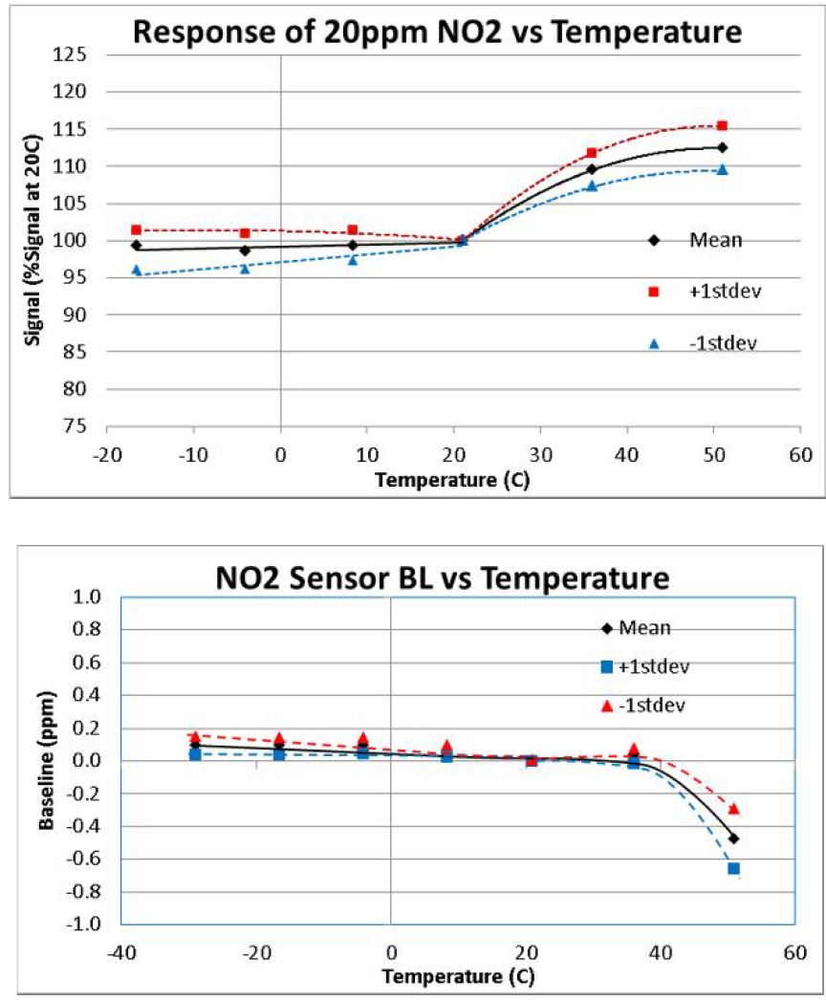

---


```
HUGE AMOUNT OF DATA: 

data_start_date: 9/14/2016 0:00

data_end_date:  9/12/2021 1:20

Most data though appears to run thru most of 2018-2020, and into 2021...
```
        

---
---

<br>